In [241]:
ROOT_DIR = "/home/bigboy/Krispin/projects/Metaworld"
%env MUJOCO_GL=egl

import sys
sys.path.append(ROOT_DIR)

import os
import functools
import json
from tqdm import tqdm
import importlib
from dataclasses import dataclass

# scientific
import cv2
import numpy as np
import torch
import pytorch_lightning as pl

# gym
# from gym.spaces import Box
import mujoco
import metaworld
from metaworld import MT1

# plotting
from PIL import Image
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from lightglue import viz2d

# project imports
# from metaworld.envs.mujoco.sawyer_xyz.test_scripted_policies import ALL_ENVS, test_cases_latest_nonoise
# import reset_space
import utils.camera_utils_v2 as cu
import keyframes.env_utils as env_utils
import keyframes.env_renderer as env_renderer
import keyframes.mujoco_utils as mujoco_utils
import keyframes.keyframe_utils as keyframe_utils
import keyframes.pl_modules as pl_modules
import utils.predict_utils as keyframe_predict

import utils.slam_utils as slam_utils
import utils.depth_utils as depth_utils
import utils.match_utils as match_utils
import utils.transform_utils as transform_utils
import utils.inference_utils as inference_utils

import models.extern.mcc_model as mcc_model
import utils.mcc_misc_utils as mcc_misc_utils
import utils.mcc_data_utils as mcc_data_utils
import utils.predict_utils as predict_utils
import utils.vis_utils as vis_utils
import utils.plotly_utils as plotly_utils
import utils.torch_utils as torch_utils

from pytorch3d.io.obj_io import load_obj

import keyframes.grasp_pose as grasp_pose
import keyframes.policies.expert_policy_utils as expert_policy_utils
import keyframes.policies.pick_place_policy as pick_place_policy


from PIL import Image
import requests
from transformers import AutoProcessor, CLIPModel
import keyframes.notebooks.iterative_feature_matching.iter_fts_match as iter_fts_match
import keyframes.notebooks.iterative_feature_matching.f3rm.features.clip as CLIP
import keyframes.notebooks.iterative_feature_matching.f3rm.pca_colormap as pca_colormap
import torchvision.transforms.functional as tF

from torchvision.transforms import CenterCrop, Compose, Resize

DEVICE = "cuda:0"


env: MUJOCO_GL=egl


In [2]:
importlib.reload(viz2d)

<module 'lightglue.viz2d' from '/home/bigboy/miniconda3/envs/kf/lib/python3.9/site-packages/lightglue/viz2d.py'>

In [35]:
# load model


clip_model_name = "ViT-L/14@336px"
model, preprocess = CLIP.clip.load(clip_model_name, device=DEVICE)
preprocess_no_center_crop = Compose(
    [t for t in preprocess.transforms if not isinstance(t, CenterCrop)]
)
patch_size = model.visual.patch_size
input_resolution = model.visual.input_resolution


def preprocess_image(image):
    # much worse results if center crop is used
    inputs = preprocess_no_center_crop(image)
    return inputs.to(DEVICE)


def vit_encoder(inputs):
    with torch.no_grad():
        outputs = model.get_patch_encodings(inputs)
    return outputs  # (b, h_in // patch_size * w_in // patch_size, 768)



# # openai/clip-vit-large-patch14
# model = CLIPModel.from_pretrained("openai/clip-vit-large-patch14-336")
# model.to(DEVICE)
# processor = AutoProcessor.from_pretrained("openai/clip-vit-large-patch14-336")
# patch_size = 14
# input_resolution = 336


# def preprocess_image(image):
#     inputs = processor(images=image, return_tensors="pt")
#     return inputs["pixel_values"][0].to(DEVICE)


# def vit_encoder(inputs):
#     with torch.no_grad():
#         outputs = model.vision_model(pixel_values=inputs)
#     return outputs.last_hidden_state[:,:-1,:] # (b, h_in // patch_size * w_in // patch_size, 1024)

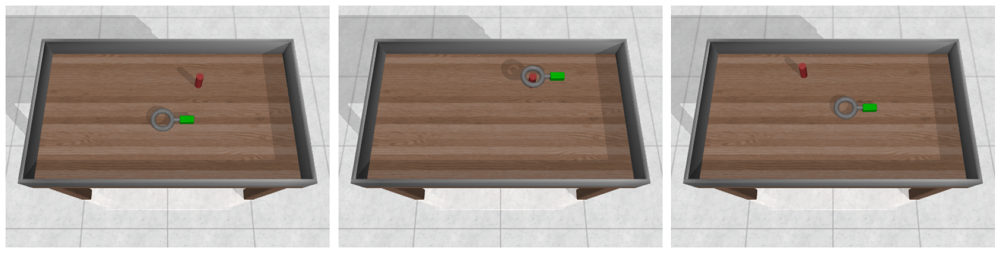

In [14]:
# generate keyframes
# reference keyframes env

# param
env_index = 0
img_height, img_width = 360, 480

# generate env and renderer
env, expert_policy, renderer = env_utils.generate_env_and_renderer(env_index, height=img_height, width=img_width, camera_name="keyframes")
T_world2pixel = cu.get_camera_transform_matrix(env, "keyframes", img_height, img_width)
T_pixel2world = np.linalg.inv(T_world2pixel)


# generate keyframes
keyframe_data = keyframe_utils.generate_keyframes(env, renderer)

img_ref_0 = keyframe_data["img"][0]
img_ref_1 = keyframe_data["img"][1]
depth_ref_0 = keyframe_data["depth"][0]
depth_ref_1 = keyframe_data["depth"][1]

# generate keyframe of current env
img_cur, depth_cur = keyframe_utils.generate_cur_keyframe(env, renderer)

viz2d.plot_images([img_ref_0, img_ref_1, img_cur])

img1 = img_ref_0
img2 = img_ref_1
depth1 = depth_ref_0
depth2 = depth_ref_1

In [5]:
# # load data
# img1 = Image.open("/home/bigboy/Krispin/projects/Metaworld/keyframes/notebooks/iterative_feature_matching/Photos-001/t-shirt_sport_yellow.jpg")
# img2 = Image.open("/home/bigboy/Krispin/projects/Metaworld/keyframes/notebooks/iterative_feature_matching/Photos-001/t-shirt_sport_yellow_2.jpg")
img1 = Image.open("/home/bigboy/Krispin/projects/Metaworld/keyframes/notebooks/iterative_feature_matching/Photos-001/laptop-1.jpg")
img2 = Image.open("/home/bigboy/Krispin/projects/Metaworld/keyframes/notebooks/iterative_feature_matching/Photos-001/laptop-2.jpg")
img1 = np.array(img1)
img2 = np.array(img2)
scale_img0 = np.min(img1.shape[:2]) / 336
scale_img1 = np.min(img2.shape[:2]) / 336
img1 = cv2.resize(img1, np.array((img1.shape[1] // scale_img0, img1.shape[0] // scale_img0)).astype(int))
img2 = cv2.resize(img2, np.array((img2.shape[1] // scale_img1, img2.shape[0] // scale_img1)).astype(int))

In [6]:
# t1 = preprocess_image(Image.fromarray(img1))
# t1 = vit_encoder(t1.unsqueeze(0))
# t1.shape

In [32]:
importlib.reload(iter_fts_match)

<module 'keyframes.notebooks.iterative_feature_matching.iter_fts_match' from '/home/bigboy/Krispin/projects/Metaworld/keyframes/notebooks/iterative_feature_matching/iter_fts_match.py'>

In [31]:
cur_img_crop_embeddings.shape

torch.Size([2, 24, 32, 768])

Extracting CLIP features: 100%|██████████| 1/1 [00:00<00:00, 91.34it/s]


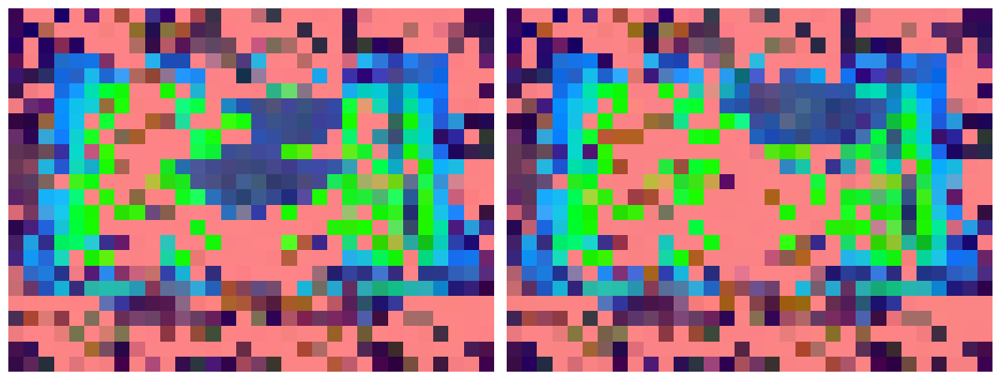

In [37]:
cur_img_crop_embeddings = iter_fts_match.embed_imgs(
    imgs=np.stack([img1, img2]),
    preprocess=preprocess_image,
    vit_encoder=vit_encoder,
    patch_size=patch_size,
    device="cuda:0",
    batch_size=8,
)
colored_image = pca_colormap.apply_pca_colormap(cur_img_crop_embeddings.float().cpu())
viz2d.plot_images([colored_image[i].detach().cpu().numpy() for i in range(colored_image.shape[0])])

In [6]:
fig = px.imshow(np.mean(img1, axis=-1))
fig.show()

In [7]:
queries_xy=(234, 142)
target_xy, attns, cur_img1_crops, cur_img2_crops = iter_fts_match.iterative_feature_matching(
    preprocess=preprocess_image,
    vit_encoder=vit_encoder,
    input_resolution=input_resolution,
    patch_size=patch_size,
    img1=img1,
    img2=img2,
    query_xy=queries_xy,
    crop_half_sizes=[80, 60, 30, 30],
    blur_sizes=[3, 0, 0, 0],
    batch_size=8,
    device="cuda:0",
    log=True,
)

Extracting CLIP features: 100%|██████████| 1/1 [00:00<00:00, 74.37it/s]


Extracting CLIP features: 100%|██████████| 1/1 [00:00<00:00, 95.17it/s]


iter 0: target_xy=(240, 90)


Extracting CLIP features: 100%|██████████| 1/1 [00:00<00:00, 103.58it/s]


iter 1: target_xy=(236, 106)


Extracting CLIP features: 100%|██████████| 1/1 [00:00<00:00, 103.25it/s]


iter 2: target_xy=(243, 93)


Extracting CLIP features: 100%|██████████| 1/1 [00:00<00:00, 106.86it/s]


iter 3: target_xy=(243, 93)


Extracting CLIP features: 100%|██████████| 1/1 [00:00<00:00, 102.88it/s]


iter 4: target_xy=(243, 93)


In [177]:
importlib.reload(viz2d)

<module 'lightglue.viz2d' from '/home/bigboy/miniconda3/envs/kf/lib/python3.9/site-packages/lightglue/viz2d.py'>

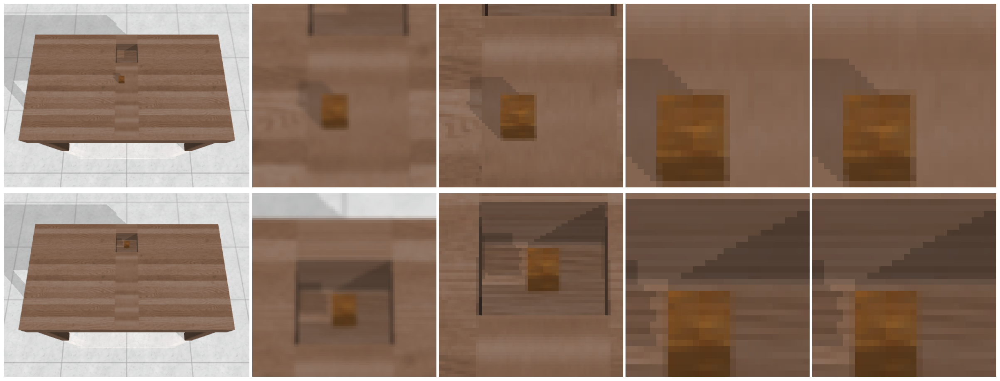

In [8]:
viz2d.plot_grid([cur_img1_crops, cur_img2_crops])

In [9]:
fig = px.imshow(attns[3])
fig.show()

## Evaluate on Metaworld

In [7]:
from typing import Union, Callable, List, Tuple, Optional


In [268]:
def create_img_crop_origins_grid(img_shape, crop_half_size: int) -> np.ndarray:
    """
    Args:
        img_shape: (h, w, 3)
        crop_size: crop size
        blur_size: blur size

    Returns:
        patch_origins_xy: (n, 2)
    """
    h, w = img_shape[:2]
    crop_size = 2 * crop_half_size
    n_h = h // crop_size
    n_w = w // crop_size

    patch_origins_xy = []

    for i in range(n_h):
        for j in range(n_w):
            patch_origin_xy = (
                j * crop_size,
                i * crop_size,
            )
            patch_origins_xy.append(patch_origin_xy)
            # add another patch which overlaps with the previous patch by half
            if (patch_origin_xy[0] + crop_size + crop_half_size) <= w and (
                patch_origin_xy[1] + crop_size + crop_half_size
            ) <= h:
                patch_origin_xy = (
                    j * crop_size + crop_half_size,
                    i * crop_size + crop_half_size,
                )
                patch_origins_xy.append(patch_origin_xy)
    return np.array(patch_origins_xy)


def create_img_crop_origins(
    img_shape, crop_centers_xy, crop_half_size: int
) -> np.ndarray:
    """
    Args:
        img_shape: (h, w, 3)
        crop_centers_xy: (n, 2)
        crop_half_size: crop half size
    """
    h, w = img_shape[:2]
    crop_size = 2 * crop_half_size
    crop_origins = np.zeros_like(crop_centers_xy)

    # makes sure crop centers are at least crop_half_size away from the image border
    crop_origins[:, 0] = np.clip(crop_centers_xy[:, 0], 0, w - crop_size)
    crop_origins[:, 1] = np.clip(crop_centers_xy[:, 1], 0, h - crop_size)

    return crop_origins


def extract_img_crops(
    img: np.ndarray,
    patch_origins_xy: Union[List[Tuple[int, int]], np.ndarray],
    crop_half_size: int,
    blur_size: Optional[int] = None,
) -> List[np.ndarray]:
    """
    Args:
        img: (h, w, 3)
        patch_origins: list of patch origins or (n, 2)
    """
    img_patches = []
    for i in range(len(patch_origins_xy)):
        patch_origin_xy = patch_origins_xy[i]
        img_crop, _, _ = iter_fts_match.crop_image(
            img,
            crop_center_xy=(
                patch_origin_xy[0] + crop_half_size,
                patch_origin_xy[1] + crop_half_size,
            ),
            crop_half_size=(crop_half_size, crop_half_size),
            blur_size=blur_size,
        )
        img_patches.append(img_crop)
    return img_patches


def query_embedding(query_embd: torch.Tensor, img_embd: torch.Tensor):
    """
    Args:
        query_embd: (c)
        img_embd: (b, h, w, c)

    Returns:
        attn: (b, h, w)
    """
    with torch.no_grad():
        b, h, w, c = img_embd.shape

        # normalize
        query_embd = query_embd / torch.norm(query_embd)
        img_embd = img_embd / torch.norm(img_embd, dim=-1, keepdim=True)

        attn = torch.sum(img_embd * query_embd, dim=-1)
        # attn = -torch.norm(img_embd - query_embd, dim=-1)

        # apply softmax
        attn = attn.reshape((b, -1))
        attn = torch.softmax(attn, dim=-1)
        attn = attn.reshape((b, h, w))
        return attn


def multi_query_embedding(query_embd: torch.Tensor, img_embd: torch.Tensor):
    """
    Args:
        query_embd: (nq, c)
        img_embd: (nq, h, w, c)
    Returns:
        attn: (nq, h, w)
    """
    with torch.no_grad():
        nq, h, w, c = img_embd.shape

        # normalize
        query_embd = query_embd / torch.norm(
            query_embd, dim=-1, keepdim=True
        )  # (nq, c)
        img_embd = img_embd / torch.norm(img_embd, dim=-1, keepdim=True)  # (b, h, w, c)

        attn = torch.einsum(
            "nc,nhwc->nhw", query_embd.float(), img_embd.float()
        )  # (nq, h, w)

        # apply softmax
        attn = attn.reshape((nq, -1))
        attn = torch.softmax(attn, dim=-1)
        attn = attn.reshape((nq, h, w))
        # attn = attn.reshape((b, -1))
        # attn = torch.softmax(attn, dim=-1)
        # attn = attn.reshape((b, h, w))
        return attn


def iterative_feature_matching_fast(
    preprocess: Callable[[Image.Image], torch.Tensor],
    vit_encoder: Callable[[torch.Tensor], torch.Tensor],
    input_resolution: int,
    patch_size: int,
    img1: np.ndarray,
    img2: np.ndarray,
    queries_xy,
    crop_half_sizes=[40, 25, 20],
    blur_sizes=[5, 11, 13],
    batch_size=8,
    device="cuda:0",
    log=True,
):
    """
    Args:
        preprocess: preprocess function takes PIL image and returns (3, h_in, w_in)
        vit_encoder: vit encoder function takes imgs (b, 3, h_in, w_in) and returns (b, h_in * w_in, c) where c is the embedding size
        input_resolution: input resolution
        patch_size: patch size
        img1: (h, w, c)
        img2: (h, w, c)
        queries_xy: (nq, 2)
        crop_sizes: list of crop sizes
        blur_sizes: list of blur sizes. NOTE blur size must be odd
        batch_size: batch size
        device: device

    Returns:
        target_xy: (nq, x, y)
    """
    nq = queries_xy.shape[0]
    target_xy: Union[np.ndarray, None] = None

    all_img_crops = []
    all_attns = []

    cur_img1_crops = [img1]
    cur_img2_crops = [img2]
    cur_img1_crop_origins_xy = np.zeros((nq, 2), dtype=int)
    cur_img2_crop_origins_xy = np.zeros((nq, 2), dtype=int)
    cur_crop_half_size = 0
    for i in range(len(crop_half_sizes) + 1):
        all_img_crops.append((cur_img1_crops, cur_img2_crops))

        # embed img1 and img2 crops
        cur_img_crops = cur_img1_crops + cur_img2_crops
        cur_img_crop_embeddings: torch.Tensor = iter_fts_match.embed_imgs(
            imgs=cur_img_crops,
            preprocess=preprocess,
            vit_encoder=vit_encoder,
            patch_size=patch_size,
            device=device,
            batch_size=batch_size,
            log=log,
        )
        cur_img1_crop_embd = cur_img_crop_embeddings[
            : len(cur_img1_crops)
        ]  # shape (n1, hp, wp, c)
        cur_img2_crop_embd = cur_img_crop_embeddings[
            len(cur_img1_crops) :
        ]  # shape (n2, hp, wp, c)

        # for eqach query keypoint select closest crop in img1
        cur_img1_crop_centers_xy = cur_img1_crop_origins_xy + cur_crop_half_size
        query_img1_crop_ids = np.argmin(
            np.linalg.norm(
                queries_xy[:, None, :] - cur_img1_crop_centers_xy[None, :, :], axis=-1
            ),
            axis=-1,
        )  # shape (nq)
        query_img1_crop_origins_xy = cur_img1_crop_origins_xy[query_img1_crop_ids]
        query_img1_crop_embd = cur_img1_crop_embd[
            query_img1_crop_ids
        ]  # shape (nq, hp, wp, c)

        # for each target keypoint select closest crop in img2
        cur_img2_crop_centers_xy = cur_img2_crop_origins_xy + cur_crop_half_size
        if target_xy is None:
            target_img2_crop_ids: np.ndarray = np.zeros((nq,), dtype=int)
        else:
            target_img2_crop_ids = np.argmin(
                np.linalg.norm(
                    target_xy[:, None, :] - cur_img2_crop_centers_xy[None, :, :],
                    axis=-1,
                ),
                axis=-1,
            ).astype(
                int
            )  # shape (nq)
        target_img2_crop_origins_xy = cur_img2_crop_origins_xy[target_img2_crop_ids]
        target_img2_crop_embd = cur_img2_crop_embd[
            target_img2_crop_ids
        ]  # shape (nq, hp, wp, c)

        # for each query keypoint select closest patch in corresponding crop in img1
        patch_query_xy = queries_xy - query_img1_crop_origins_xy
        patch_query_x, patch_query_y = iter_fts_match.img_coords_orig_to_resized_np(
            patch_query_xy[:, 0],
            patch_query_xy[:, 1],
            cur_img1_crops[0].shape,
            input_resolution,
        )
        patch_query_xy = np.stack([patch_query_x, patch_query_y], axis=-1)
        query_img1_crop_patch_xy = np.floor(patch_query_xy / patch_size).astype(int)
        # print("query_img1_crop_patch_xy", query_img1_crop_patch_xy)
        query_img1_crop_embd_of_patch = query_img1_crop_embd[
            np.arange(nq),
            query_img1_crop_patch_xy[:, 1],
            query_img1_crop_patch_xy[:, 0],
        ]  # shape (nq, c)

        # compute attention between each query point and its corresponding crop in img2
        attn = multi_query_embedding(
            query_img1_crop_embd_of_patch, target_img2_crop_embd
        )  # shape (nq, hp, wp)
        attn = tF.gaussian_blur(attn, kernel_size=[3,3], sigma=[0.5, 0.5])  # , sigma=[1, 1]

        attn_np: np.ndarray = torch_utils.to_numpy(attn)
        # attn_np = cv2.GaussianBlur(attn_np, (3, 3), 0)
        
        all_attns.append(attn_np)

        hp, wp = attn_np.shape[1:]
        attn_np = attn_np.reshape((nq, hp * wp))  # shape (nq, hp * wp)
        attn_argmax = np.argmax(attn_np, axis=-1)  # shape (nq,)
        target_y, target_x = np.unravel_index(
            attn_argmax, (hp, wp)
        )  # shape (nq,), (nq,)
        target_x *= patch_size
        target_y *= patch_size

        target_x, target_y = iter_fts_match.img_coords_resized_to_orig_np(
            target_x, target_y, cur_img2_crops[0].shape, input_resolution
        )

        target_x = target_img2_crop_origins_xy[:, 0] + target_x
        target_y = target_img2_crop_origins_xy[:, 1] + target_y
        target_xy = np.stack([target_x, target_y], axis=-1)  # shape (nq, 2)

        if i < len(crop_half_sizes):
            cur_crop_half_size = crop_half_sizes[i]
            blur_size = blur_sizes[i]
            # cur_img1_crop_origins = create_img_crop_origins(img1.shape, queries_xy, cur_crop_half_size)
            # cur_img2_crop_origins = create_img_crop_origins(img2.shape, (target_x, target_y), cur_crop_half_size)
            cur_img1_crop_origins_xy = create_img_crop_origins_grid(
                img1.shape, cur_crop_half_size
            )
            cur_img2_crop_origins_xy = create_img_crop_origins_grid(
                img2.shape, cur_crop_half_size
            )
            cur_img1_crop_centers_xy = cur_img1_crop_origins_xy + cur_crop_half_size
            cur_img2_crop_centers_xy = cur_img2_crop_origins_xy + cur_crop_half_size
            query_img1_crop_ids = np.argmin(
                np.linalg.norm(
                    queries_xy[:, None, :] - cur_img1_crop_centers_xy[None, :, :],
                    axis=-1,
                ),
                axis=-1,
            ).astype(
                int
            )  # shape (nq)
            target_img2_crop_ids = np.argmin(
                np.linalg.norm(
                    target_xy[:, None, :] - cur_img2_crop_centers_xy[None, :, :],
                    axis=-1,
                ),
                axis=-1,
            ).astype(
                int
            )  # shape (nq)
            query_img1_crop_ids_set = list(set(query_img1_crop_ids))
            target_img2_crop_ids_set = list(set(target_img2_crop_ids))

            # filter crops
            cur_img1_crop_origins_xy = cur_img1_crop_origins_xy[query_img1_crop_ids_set]
            cur_img2_crop_origins_xy = cur_img2_crop_origins_xy[
                target_img2_crop_ids_set
            ]

            cur_img1_crop_centers_xy = cur_img1_crop_centers_xy[query_img1_crop_ids_set]
            cur_img2_crop_centers_xy = cur_img2_crop_centers_xy[
                target_img2_crop_ids_set
            ]

            cur_img1_crops = extract_img_crops(
                img1, cur_img1_crop_origins_xy, cur_crop_half_size, blur_size
            )
            cur_img2_crops = extract_img_crops(
                img2, cur_img2_crop_origins_xy, cur_crop_half_size, blur_size
            )

        # TODO replace with log function from library
        if log:
            print(f"iter {i}")

    return target_xy, all_attns, all_img_crops

In [240]:
tF.gaussian_blur(torch.from_numpy(img1).permute(2, 0, 1).unsqueeze(0), kernel_size=[3,3], sigma=[0.5, 0.5]).shape

torch.Size([1, 3, 360, 480])

In [205]:
importlib.reload(iter_fts_match)

<module 'keyframes.notebooks.iterative_feature_matching.iter_fts_match' from '/home/bigboy/Krispin/projects/Metaworld/keyframes/notebooks/iterative_feature_matching/iter_fts_match.py'>

In [137]:
kpts.shape

(57, 2)

In [209]:
img1 = img_ref_0
img2 = img_cur

In [224]:
fig = px.imshow(np.mean(img1, axis=-1))
fig.show()

Extracting CLIP features:   0%|          | 0/1 [00:00<?, ?it/s]

preprocessing images...
transferring to device torch.Size([2, 3, 336, 448]) cuda:0
embedding...


Extracting CLIP features: 100%|██████████| 1/1 [00:01<00:00,  1.30s/it]


iter 0


Extracting CLIP features:   0%|          | 0/1 [00:00<?, ?it/s]

preprocessing images...
transferring to device torch.Size([8, 3, 336, 336]) cuda:0
embedding...


Extracting CLIP features: 100%|██████████| 1/1 [00:03<00:00,  3.49s/it]


iter 1


Extracting CLIP features:   0%|          | 0/2 [00:00<?, ?it/s]

preprocessing images...
transferring to device torch.Size([8, 3, 336, 336]) cuda:0
embedding...


Extracting CLIP features:  50%|█████     | 1/2 [00:03<00:03,  3.50s/it]

preprocessing images...
transferring to device torch.Size([5, 3, 336, 336]) cuda:0
embedding...


Extracting CLIP features: 100%|██████████| 2/2 [00:05<00:00,  2.85s/it]


iter 2


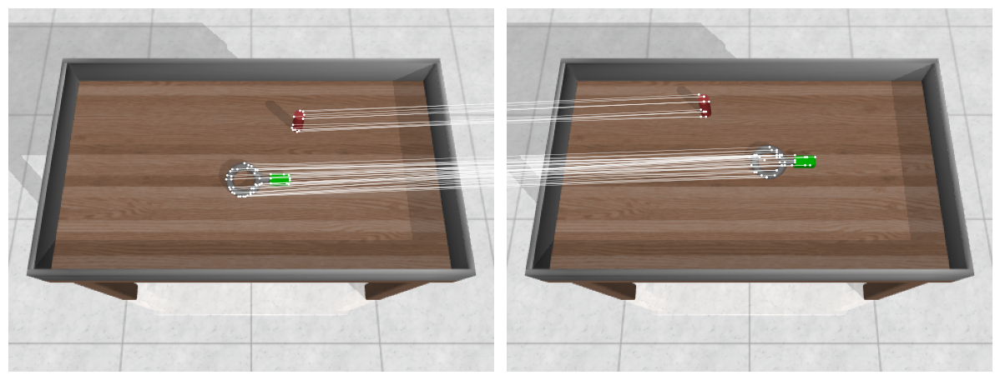

In [271]:
target_xy, all_attns, all_img_crops = iterative_feature_matching_fast(
    preprocess=preprocess_image,
    vit_encoder=vit_encoder,
    input_resolution=input_resolution,
    patch_size=patch_size,
    img1=img1,
    img2=img2,
    queries_xy=kpts,
    crop_half_sizes=[40, 30],
    blur_sizes=[3, 0],
    batch_size=8,
    device="cuda:0",
    log=True,
)
viz2d.plot_images([img1, img2])
viz2d.plot_matches(kpts, target_xy, color="white", lw=0.3, ps=1, a=1)

In [255]:
df = {
    "x": kpts[:, 0],
    "y": -kpts[:, 1],
    "id": np.arange(kpts.shape[0]),
}
px.scatter(df, x="x", y="y", hover_data=["id"])

In [260]:
df = {
    "x": target_xy[:, 0],
    "y": -target_xy[:, 1],
    "id": np.arange(kpts.shape[0]),
}
px.scatter(df, x="x", y="y", hover_data=["id"])

In [237]:
test = cv2.GaussianBlur(img1[:,:,0], (31, 31), 0)

In [232]:
np.stack([img1, img2]).shape

(2, 360, 480, 3)

In [230]:
test.shape

(2, 360)

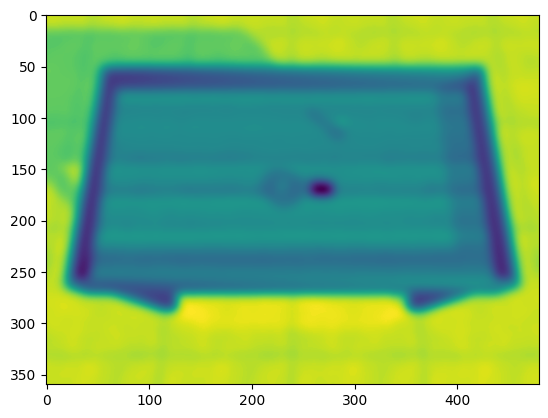

In [238]:
plt.imshow(test)

In [177]:
len(all_img_crops[0])

2

In [179]:
len(all_img_crops)

4

In [183]:
len(all_img_crops[0][0][0])

1

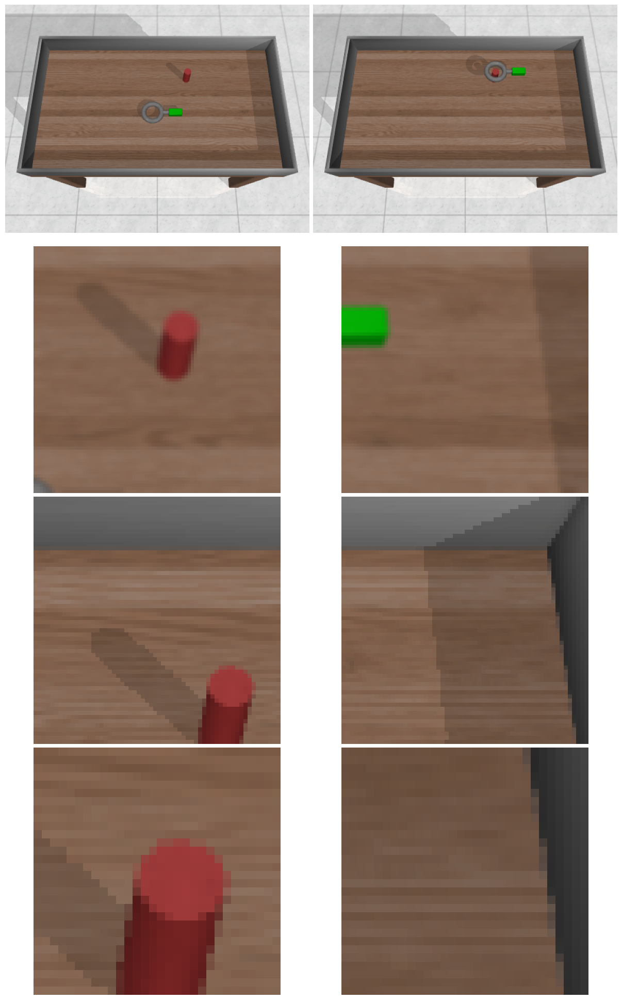

In [200]:
all_imgs_0 = []
for i in range(len(all_img_crops)):
    img1_crops, img2_crops = all_img_crops[i]
    all_imgs_0.append([img1_crops[0]] + [img2_crops[0]])
viz2d.plot_grid(all_imgs_0)

In [217]:
all_attns[0].shape

(57, 24, 32)

In [219]:
len(all_attns)

4

In [264]:
fig = px.imshow(all_attns[3][48])
fig.show()

In [129]:
set(np.ones(3))

{1.0}

In [145]:
np.stack([np.ones(3), np.ones(3)], axis=-1).shape

(3, 2)

In [16]:
# use superglue keypoints as query points
# load feature extractor
model_fts_extract = slam_utils.get_super_glue_extractor(device=DEVICE)

In [17]:
fts_ref_0 = slam_utils.compute_features(model_fts_extract, img1)
fts_ref_1 = slam_utils.compute_features(model_fts_extract, img2)
fts_ref_0 = torch_utils.to_numpy(fts_ref_0)
fts_ref_1 = torch_utils.to_numpy(fts_ref_1)
kpts_ref_0 = fts_ref_0["keypoints"]
kpts_ref_1 = fts_ref_1["keypoints"]
desc_ref_0 = fts_ref_0["descriptors"]
desc_ref_1 = fts_ref_1["descriptors"]
kpts_scores_ref_0 = fts_ref_0["keypoint_scores"]
kpts_scores_ref_1 = fts_ref_1["keypoint_scores"]

In [18]:
kpts_ref_0.shape

(1382, 2)

In [19]:
# TODO process and filter keypoints
kpts = kpts_ref_0.copy()
depth = depth_ref_0.copy()
desc = desc_ref_0.copy()
wpos_kpts, pixel_coords, adjusted_pixel_coords_xy = depth_utils.pixel_coords_to_world_coords(
    T_pixel2world=T_pixel2world, real_depth=depth, pixel_coords_xy=kpts, return_adjusted_pixel_coords_xy=True
)
kpts = adjusted_pixel_coords_xy
mask = match_utils.create_feature_table_mask(wpos_kpts)
kpts = kpts[mask]
wpos_kpts = wpos_kpts[mask]
desc = desc[mask]

In [20]:
kpts.shape

(57, 2)

In [131]:
torch.cuda.empty_cache()

In [132]:
torch.cuda.memory_allocated(device="cuda:0") / 10**9

1.18486784

In [102]:
model = torch.compile(model)

In [103]:
def vit_encoder(inputs):
    with torch.no_grad():
        outputs = model.get_patch_encodings(inputs)
    return outputs  # (b, h_in // patch_size * w_in // patch_size, 768)

In [119]:
torch.cuda.synchronize(device=DEVICE)

In [127]:
imgs = cur_img_crops
h_in, w_in = preprocess_no_center_crop(Image.fromarray(imgs[0])).shape[-2:]
batch_size = 2
i = 0
batch = [
    preprocess_no_center_crop(Image.fromarray(imgs[j])) for j in range(i, min(i+batch_size, len(imgs)))
]
batch = torch.stack(batch)
print("transferring to device", batch.shape, batch.device)
batch = batch.to(DEVICE)
embeddings = vit_encoder(batch)
embeddings

transferring to device torch.Size([2, 3, 336, 448]) cpu


tensor([[[ 1.1250,  0.0590, -0.7612,  ...,  0.4978, -0.2891, -0.3430],
         [-0.0825, -0.7812, -0.6543,  ...,  0.5142, -0.2532, -0.7275],
         [-0.0534, -0.6880, -0.6514,  ...,  0.5342, -0.3245, -0.7637],
         ...,
         [-0.0093, -0.7534, -0.6499,  ...,  0.5596, -0.2688, -0.8613],
         [-0.0322, -0.6396, -0.6362,  ...,  0.5728, -0.3188, -0.8135],
         [ 0.9272, -0.0464, -0.6719,  ...,  0.5234, -0.1558, -0.4204]],

        [[ 1.1250,  0.0590, -0.7612,  ...,  0.4978, -0.2891, -0.3430],
         [-0.0825, -0.7812, -0.6543,  ...,  0.5142, -0.2532, -0.7275],
         [-0.0534, -0.6880, -0.6514,  ...,  0.5342, -0.3245, -0.7637],
         ...,
         [-0.0093, -0.7534, -0.6499,  ...,  0.5596, -0.2688, -0.8613],
         [-0.0322, -0.6396, -0.6362,  ...,  0.5728, -0.3188, -0.8135],
         [ 0.9272, -0.0464, -0.6719,  ...,  0.5234, -0.1558, -0.4204]]],
       device='cuda:0', dtype=torch.float16)

In [128]:
imgs = cur_img_crops
h_in, w_in = preprocess_no_center_crop(Image.fromarray(imgs[0])).shape[-2:]
batch_size = 2

# Get CLIP embeddings for the images
torch.cuda.synchronize(device=DEVICE)

for i in tqdm(
    range(0, len(imgs), batch_size),
    desc="Extracting CLIP features"
):
    torch.cuda.synchronize(device=DEVICE)
    # batch = preprocessed_images[i : i + batch_size]
    print("preprocessing images...", i)
    batch = [
        preprocess_no_center_crop(Image.fromarray(imgs[j])) for j in range(i, min(i+batch_size, len(imgs)))
    ]
    batch = torch.stack(batch)
    print("transferring to device", batch.shape, batch.device)
    batch = batch.to(DEVICE)
    print("embed", batch.shape, batch.device)
    with torch.no_grad():
        embeddings = vit_encoder(batch)


Extracting CLIP features:   0%|          | 0/12 [00:00<?, ?it/s]

preprocessing images... 0
transferring to device torch.Size([2, 3, 336, 448]) cpu
embed torch.Size([2, 3, 336, 448]) cuda:0


Extracting CLIP features:  17%|█▋        | 2/12 [00:01<00:06,  1.50it/s]

preprocessing images... 2
transferring to device torch.Size([2, 3, 336, 448]) cpu
embed torch.Size([2, 3, 336, 448]) cuda:0
preprocessing images... 4


Extracting CLIP features:  25%|██▌       | 3/12 [00:02<00:08,  1.01it/s]

transferring to device torch.Size([2, 3, 336, 448]) cpu
embed torch.Size([2, 3, 336, 448]) cuda:0
preprocessing images... 6


Extracting CLIP features:  33%|███▎      | 4/12 [00:04<00:09,  1.15s/it]

transferring to device torch.Size([2, 3, 336, 448]) cpu
embed torch.Size([2, 3, 336, 448]) cuda:0
preprocessing images... 8


Extracting CLIP features:  42%|████▏     | 5/12 [00:05<00:08,  1.23s/it]

transferring to device torch.Size([2, 3, 336, 448]) cpu
embed torch.Size([2, 3, 336, 448]) cuda:0


Extracting CLIP features:  50%|█████     | 6/12 [00:07<00:07,  1.30s/it]

preprocessing images... 10
transferring to device torch.Size([2, 3, 336, 448]) cpu
embed torch.Size([2, 3, 336, 448]) cuda:0
preprocessing images... 12


Extracting CLIP features:  58%|█████▊    | 7/12 [00:08<00:06,  1.33s/it]

transferring to device torch.Size([2, 3, 336, 448]) cpu
embed torch.Size([2, 3, 336, 448]) cuda:0
preprocessing images... 14


Extracting CLIP features:  67%|██████▋   | 8/12 [00:09<00:05,  1.35s/it]

transferring to device torch.Size([2, 3, 336, 448]) cpu
embed torch.Size([2, 3, 336, 448]) cuda:0
preprocessing images... 16


Extracting CLIP features:  75%|███████▌  | 9/12 [00:11<00:04,  1.37s/it]

transferring to device torch.Size([2, 3, 336, 448]) cpu
embed torch.Size([2, 3, 336, 448]) cuda:0


Extracting CLIP features:  83%|████████▎ | 10/12 [00:12<00:02,  1.37s/it]

preprocessing images... 18
transferring to device torch.Size([2, 3, 336, 448]) cpu
embed torch.Size([2, 3, 336, 448]) cuda:0
preprocessing images... 20


Extracting CLIP features:  92%|█████████▏| 11/12 [00:13<00:01,  1.37s/it]

transferring to device torch.Size([2, 3, 336, 448]) cpu
embed torch.Size([2, 3, 336, 448]) cuda:0
preprocessing images... 22


Extracting CLIP features: 100%|██████████| 12/12 [00:15<00:00,  1.28s/it]

transferring to device torch.Size([2, 3, 336, 448]) cpu
embed torch.Size([2, 3, 336, 448]) cuda:0


In [91]:
embeddings = iter_fts_match.embed_imgs(
    imgs=cur_img_crops,
    preprocess=preprocess_no_center_crop,
    vit_encoder=vit_encoder,
    patch_size=patch_size,
    device="cuda:0",
    batch_size=100,
    log=True
)

Extracting CLIP features:   0%|          | 0/1 [00:00<?, ?it/s]

preprocessing images...
transferring to device torch.Size([60, 3, 336, 448]) cpu


Extracting CLIP features: 100%|██████████| 1/1 [00:40<00:00, 40.50s/it]

embedding...


In [61]:
embeddings.device

device(type='cuda', index=0)

In [34]:
target_xy, cur_img1_crops, cur_img2_crops = iterative_feature_matching_fast(
    preprocess=preprocess_image,
    vit_encoder=vit_encoder,
    input_resolution=input_resolution,
    patch_size=patch_size,
    img1=img1,
    img2=img2,
    queries_xy=kpts,
    crop_half_sizes=[40, 30, 15, 15],
    blur_sizes=[3, 0, 0, 0],
    batch_size=8,
    device="cuda:0",
    log=True,
)

inputs torch.Size([3, 336, 448])
inputs torch.Size([3, 336, 448])
inputs torch.Size([3, 336, 448])
inputs torch.Size([3, 336, 448])
inputs torch.Size([3, 336, 448])
inputs torch.Size([3, 336, 448])
inputs torch.Size([3, 336, 448])
inputs torch.Size([3, 336, 448])
inputs torch.Size([3, 336, 448])
inputs torch.Size([3, 336, 448])
inputs torch.Size([3, 336, 448])
inputs torch.Size([3, 336, 448])
inputs torch.Size([3, 336, 448])
inputs torch.Size([3, 336, 448])
inputs torch.Size([3, 336, 448])
inputs torch.Size([3, 336, 448])
inputs torch.Size([3, 336, 448])
inputs torch.Size([3, 336, 448])
inputs torch.Size([3, 336, 448])
inputs torch.Size([3, 336, 448])
inputs torch.Size([3, 336, 448])
inputs torch.Size([3, 336, 448])
inputs torch.Size([3, 336, 448])
inputs torch.Size([3, 336, 448])
inputs torch.Size([3, 336, 448])
inputs torch.Size([3, 336, 448])
inputs torch.Size([3, 336, 448])
inputs torch.Size([3, 336, 448])
inputs torch.Size([3, 336, 448])
inputs torch.Size([3, 336, 448])
inputs tor

Extracting CLIP features: 100%|██████████| 15/15 [01:16<00:00,  5.07s/it]


TypeError: No loop matching the specified signature and casting was found for ufunc floor

In [35]:
target_xy = np.zeros_like(kpts)
for i in tqdm(range(kpts.shape[0])):
    query_xy_ = kpts[i,:]
    target_xy[i,:], attns, cur_img1_crops, cur_img2_crops = iter_fts_match.iterative_feature_matching(
        preprocess=preprocess_image,
        vit_encoder=vit_encoder,
        input_resolution=input_resolution,
        patch_size=patch_size,
        img1=img1,
        img2=img2,
        query_xy=query_xy_,
        crop_half_sizes=[80, 60, 30, 30],
        blur_sizes=[3, 0, 0, 0],
        batch_size=8,
        device="cuda:0",
        log=False,
    )

100%|██████████| 62/62 [06:45<00:00,  6.54s/it]


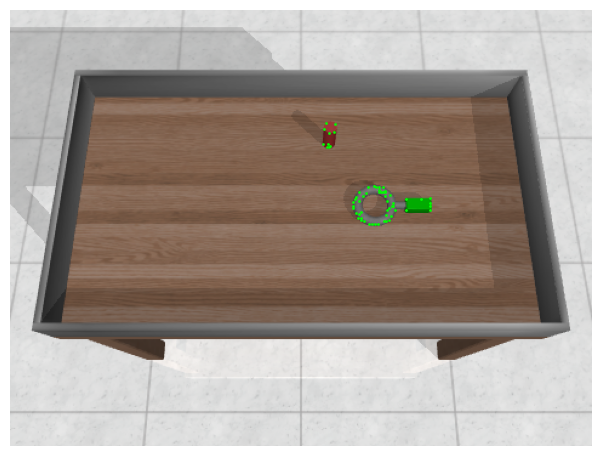

In [30]:
viz2d.plot_images([img1])
viz2d.plot_keypoints([kpts])

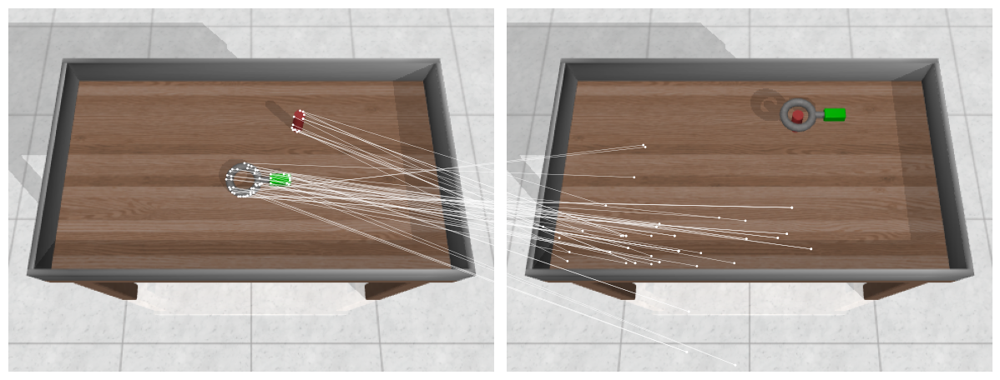

In [161]:
viz2d.plot_images([img1, img2])
viz2d.plot_matches(kpts, target_xy, color="white", lw=0.3, ps=1, a=1)

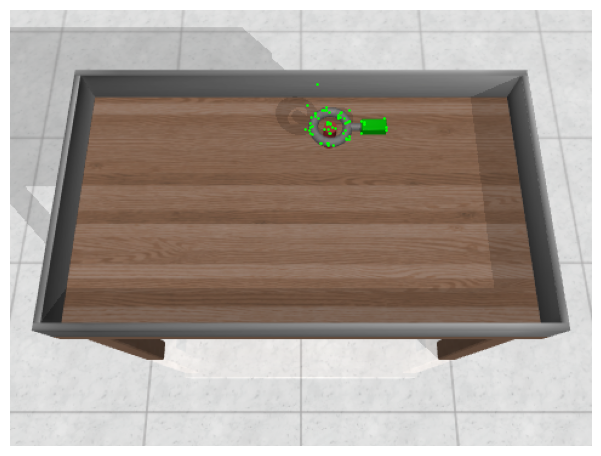

In [45]:
viz2d.plot_images([img2])
viz2d.plot_keypoints([target_xy])